In [1]:
import csv

with open('netflix_reviews1.csv', 'r') as f:
    reader = csv.reader(f)
    netflix_reviews = list(reader)
new_netflix_reviews = [j for i in netflix_reviews for j in i]
len(new_netflix_reviews)

4499

In [2]:
import csv

with open('walmart_reviews1.csv', 'r') as f:
    reader = csv.reader(f)
    walmart_reviews = list(reader)
new_walmart_reviews = [j for i in walmart_reviews for j in i]
len(new_walmart_reviews)

11329

In [3]:
import csv

with open('expedia_reviews1.csv', 'r') as f:
    reader = csv.reader(f)
    expedia_reviews = list(reader)
new_expedia_reviews = [j for i in expedia_reviews for j in i]
len(new_expedia_reviews)

7863

In [4]:
import csv

with open('match_reviews1.csv', 'r') as f:
    reader = csv.reader(f)
    match_reviews = list(reader)
new_match_reviews = [j for i in match_reviews for j in i]
len(new_match_reviews)

4534

In [5]:
import csv

with open('realtor_reviews1.csv', 'r') as f:
    reader = csv.reader(f)
    realtor_reviews = list(reader)
new_realtor_reviews = [j for i in realtor_reviews for j in i]
len(new_realtor_reviews)

659

In [6]:
import csv

with open('uni_reviews1.csv', 'r') as f:
    reader = csv.reader(f)
    uni_reviews = list(reader)
new_uni_reviews = [j for i in uni_reviews for j in i]
len(new_uni_reviews)

194

In [7]:
#from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
#analyzer = SentimentIntensityAnalyzer()
#fileloc = '/Users/angieryu2202/Desktop/netflix_compound.csv'
#fw = open(fileloc,'w',encoding='utf-8')
#for review in new_netflix_reviews:
    #vs = analyzer.polarity_scores(review)
    #print(vs['compound'])
    #fw.write(str(vs['compound']))
    #fw.write('\n')
#fw.close()

In [8]:
#analyzer = SentimentIntensityAnalyzer()
#fileloc = '/Users/angieryu2202/Desktop/walmart_compound.csv'
#fw = open(fileloc,'w',encoding='utf-8')
#for review in new_walmart_reviews:
    #vs = analyzer.polarity_scores(review)
    #print(vs['compound'])
    #fw.write(str(vs['compound']))
    #fw.write('\n')
#fw.close()

In [9]:
#analyzer = SentimentIntensityAnalyzer()
#fileloc = '/Users/angieryu2202/Desktop/expedia_compound.csv'
#fw = open(fileloc,'w',encoding='utf-8')
#for review in new_expedia_reviews:
    #vs = analyzer.polarity_scores(review)
    #print(vs['compound'])
    #fw.write(str(vs['compound']))
    #fw.write('\n')
#fw.close()

In [10]:
#analyzer = SentimentIntensityAnalyzer()
#fileloc = '/Users/angieryu2202/Desktop/match_compound.csv'
#fw = open(fileloc,'w',encoding='utf-8')
#for review in new_match_reviews:
    #vs = analyzer.polarity_scores(review)
    #print(vs['compound'])
    #fw.write(str(vs['compound']))
    #fw.write('\n')
#fw.close()

In [11]:
#analyzer = SentimentIntensityAnalyzer()
#fileloc = '/Users/angieryu2202/Desktop/realtor_compound.csv'
#fw = open(fileloc,'w',encoding='utf-8')
#for review in new_realtor_reviews:
    #vs = analyzer.polarity_scores(review)
    #print(vs['compound'])
    #fw.write(str(vs['compound']))
    #fw.write('\n')
#fw.close()

In [12]:
#analyzer = SentimentIntensityAnalyzer()
#fileloc = '/Users/angieryu2202/Desktop/uni_compound.csv'
#fw = open(fileloc,'w',encoding='utf-8')
#for review in new_uni_reviews:
    #vs = analyzer.polarity_scores(review)
    #print(vs['compound'])
    #fw.write(str(vs['compound']))
    #fw.write('\n')
#fw.close()

# POS Tagging/Decision Tree Classifier

In [7]:
import pandas as pd
compounds = pd.read_excel('new_compounds.xlsx').values.flatten()

In [8]:
targets=[]
for i in range (0,4499):
    targets.append(1)

In [9]:
for i in range (0,11329):
    targets.append(1)

In [10]:
for i in range (0,7863):
    targets.append(2)

In [11]:
for i in range (0,4534):
    targets.append(2)

In [12]:
for i in range (0,659):
    targets.append(3)

In [13]:
for i in range (0,194):
    targets.append(3)

In [14]:
reviews =  [j for i in [new_netflix_reviews, new_walmart_reviews, new_expedia_reviews, new_match_reviews, new_realtor_reviews, new_uni_reviews] for j in i]

In [15]:
d = {'reviews': reviews, 'compounds': compounds, 'targets': targets}

In [16]:
print(len(reviews))
print(len(compounds))
print(len(targets))

29078
29078
29078


In [17]:
df = pd.DataFrame(data=d)

In [18]:
import nltk
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/angieryu2202/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [19]:
from nltk.tag.stanford import CoreNLPPOSTagger

## Adverbs

In [26]:
import nltk
import string
import os

from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem.porter import PorterStemmer

token_dict = {}
stemmer = PorterStemmer()

def stem_tokens(tokens, stemmer):
    stemmed = []
    for item in tokens:
        stemmed.append(stemmer.stem(item))
    return stemmed

def tokenize(text):
    tokens = nltk.word_tokenize(text)
    stems = stem_tokens(tokens, stemmer)
    return stems

tests = reviews
index = 0
for test in tests:
    lowers = test.lower()
    translator = str.maketrans("", "", string.punctuation)
    no_punctuation = lowers.translate(translator)
    
    tags_en = nltk.pos_tag(no_punctuation.split())
    
    left = []
    for item in tags_en:
        #print(item[1])
        if "RB" in item[1]:
            left.append(item[0])
        #if "JJ" in item[1]:
            #left.append(item[0])
        #if "VB" in item[1]:
            #left.append(item[0])
        #if "NN" in item[1]:
            #left.append(item[0])
                        
    token_dict[index] = " ".join(left)
    #print(no_punctuation)
    #token_dict[index] = no_punctuation
    index = index + 1

#token_dict

In [27]:
#this can take some time
tfidf = TfidfVectorizer(tokenizer=tokenize, stop_words='english')
tfs = tfidf.fit_transform(token_dict.values())
feature_names = tfidf.get_feature_names()
class_names = ['cluster 1', 'cluster 2', 'cluster 3']

In [28]:
dat=tfs.tocoo()

In [29]:
import numpy as np
mat = np.zeros(shape=tfs.shape)

index = 0
for index in range(len(dat.col)):
    mat[dat.row[index]][dat.col[index]] = dat.data[index]
    index = index + 1

In [30]:
X1 = mat
Y1 = targets

In [31]:
from sklearn.model_selection import train_test_split
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, Y1, test_size = 0.2, random_state = 0)

In [32]:
from sklearn.tree import DecisionTreeClassifier
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100, max_depth=10000, min_samples_leaf=10, )
clf_gini1 = clf_gini.fit(X_train1, y_train1)

In [33]:
import graphviz
from sklearn import tree
dot_data1 = tree.export_graphviz(clf_gini.fit(X_train1, y_train1), out_file=None, max_depth=10000, feature_names=feature_names, class_names=class_names) 
graph1 = graphviz.Source(dot_data1)
graph1

In [34]:
import pydotplus

graph = pydotplus.graph_from_dot_data(dot_data1)
graph.write_pdf("/Users/angieryu2202/Desktop/adverb.pdf")

True

In [35]:
#Getting the accuracy score
acc1 = clf_gini1.score(X_test1, y_test1)
print("Accuracy score is {:.2f}%".format(acc1 * 100))

Accuracy score is 59.61%


In [36]:
#Import modules for Naive Bayes Classification
import pandas as pd
import numpy as np
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB

In [37]:
#Setting the GNB classifier
gnb = GaussianNB()
gnb1 = gnb.fit(X_train1, y_train1)
#Predicting the testing data
predict_list1 = gnb1.predict(X_test1)
#print("Predictions of X_test1 are" + str(predict_list1))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list1:
    if predict_list1[i] == y_test1[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list1)*100)+"%")

Accuracy score is 0.0%


In [38]:
mnb = MultinomialNB()
mnb1 =mnb.fit(X_train1, y_train1)
predict_list1 = mnb1.predict(X_test1)
#print("Predictions of X_test1 are" + str(predict_list1))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list1:
    if predict_list1[i] == y_test1[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list1)*100)+"%")

Accuracy score is 0.0%


## Verbs

In [39]:
import nltk
import string
import os

from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem.porter import PorterStemmer

token_dict = {}
stemmer = PorterStemmer()

def stem_tokens(tokens, stemmer):
    stemmed = []
    for item in tokens:
        stemmed.append(stemmer.stem(item))
    return stemmed

def tokenize(text):
    tokens = nltk.word_tokenize(text)
    stems = stem_tokens(tokens, stemmer)
    return stems

tests = reviews
index = 0
for test in tests:
    lowers = test.lower()
    translator = str.maketrans("", "", string.punctuation)
    no_punctuation = lowers.translate(translator)
    
    tags_en = nltk.pos_tag(no_punctuation.split())
    
    left = []
    for item in tags_en:
        #print(item[1])
        #if "RB" in item[1]:
            #left.append(item[0])
        #if "JJ" in item[1]:
            #left.append(item[0])
        if "VB" in item[1]:
            left.append(item[0])
        #if "NN" in item[1]:
            #left.append(item[0])
                        
    token_dict[index] = " ".join(left)
    #print(no_punctuation)
    #token_dict[index] = no_punctuation
    index = index + 1

#token_dict

In [40]:
#this can take some time
tfidf = TfidfVectorizer(tokenizer=tokenize, stop_words='english')
tfs = tfidf.fit_transform(token_dict.values())
feature_names = tfidf.get_feature_names()
class_names = ['cluster 1', 'cluster 2', 'cluster 3']

In [41]:
dat = tfs.tocoo()
dat.row
dat.col
dat.data
mat = np.zeros(shape=tfs.shape)

index = 0
for index in range(len(dat.col)):
    #print(row, col)
    #print(index)
    mat[dat.row[index]][dat.col[index]] = dat.data[index]
    index = index + 1

In [42]:
X4 = mat
Y4 = targets
X_train4, X_test4, y_train4, y_test4 = train_test_split(X4, Y4, test_size = 0.2, random_state = 0)

In [43]:
import graphviz
from sklearn import tree
dot_data4 = tree.export_graphviz(clf_gini.fit(X_train4, y_train4), out_file=None, max_depth=10000, feature_names=feature_names, class_names=class_names) 
graph4 = graphviz.Source(dot_data4)
graph4

In [44]:
graph = pydotplus.graph_from_dot_data(dot_data4)
graph.write_pdf("/Users/angieryu2202/Desktop/verb.pdf")

True

In [45]:
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100, max_depth=10000, min_samples_leaf=10, )
clf_gini4 = clf_gini.fit(X_train4, y_train4)

#Getting the accuracy score
acc4 = clf_gini4.score(X_test4, y_test4)
print("Accuracy score is {:.2f}%".format(acc4 * 100))

Accuracy score is 80.81%


In [46]:
#Setting the GNB classifier
gnb = GaussianNB()
gnb4 = gnb.fit(X_train4, y_train4)
#Predicting the testing data
predict_list4 = gnb4.predict(X_test4)
#print("Predictions of X_test4 are" + str(predict_list4))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list4:
    if predict_list4[i] == y_test4[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list4)*100)+"%")

Accuracy score is 0.0%


In [47]:
mnb = MultinomialNB()
mnb4 =mnb.fit(X_train4, y_train4)
predict_list4 = mnb4.predict(X_test4)
#print("Predictions of X_test4 are" + str(predict_list4))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list4:
    if predict_list4[i] == y_test4[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list4)*100)+"%")

Accuracy score is 42.1423658872077%


## Adjectives

In [48]:
import nltk
import string
import os

from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem.porter import PorterStemmer

token_dict = {}
stemmer = PorterStemmer()

def stem_tokens(tokens, stemmer):
    stemmed = []
    for item in tokens:
        stemmed.append(stemmer.stem(item))
    return stemmed

def tokenize(text):
    tokens = nltk.word_tokenize(text)
    stems = stem_tokens(tokens, stemmer)
    return stems

tests = reviews
index = 0
for test in tests:
    lowers = test.lower()
    translator = str.maketrans("", "", string.punctuation)
    no_punctuation = lowers.translate(translator)
    
    tags_en = nltk.pos_tag(no_punctuation.split())
    
    left = []
    for item in tags_en:
        #print(item[1])
        #if "RB" in item[1]:
            #left.append(item[0])
        if "JJ" in item[1]:
            left.append(item[0])
        #if "VB" in item[1]:
            #left.append(item[0])
        #if "NN" in item[1]:
            #left.append(item[0])
                        
    token_dict[index] = " ".join(left)
    #print(no_punctuation)
    #token_dict[index] = no_punctuation
    index = index + 1

#token_dict

In [49]:
tfidf = TfidfVectorizer(tokenizer=tokenize, stop_words='english')
tfs = tfidf.fit_transform(token_dict.values())
feature_names = tfidf.get_feature_names()
class_names = ['cluster 1', 'cluster 2', 'cluster 3']

In [50]:
dat = tfs.tocoo()
dat.row
dat.col
dat.data
mat = np.zeros(shape=tfs.shape)

index = 0
for index in range(len(dat.col)):
    #print(row, col)
    #print(index)
    mat[dat.row[index]][dat.col[index]] = dat.data[index]
    index = index + 1

In [51]:
X5 = mat
Y5 = targets
X_train5, X_test5, y_train5, y_test5 = train_test_split(X5, Y5, test_size = 0.2, random_state = 0)

In [52]:
import graphviz
from sklearn import tree
dot_data5 = tree.export_graphviz(clf_gini.fit(X_train5, y_train5), out_file=None, max_depth=10000, feature_names=feature_names, class_names=class_names) 
graph5 = graphviz.Source(dot_data5)
graph5

In [53]:
graph = pydotplus.graph_from_dot_data(dot_data5)
graph.write_pdf("/Users/angieryu2202/Desktop/adjective.pdf")

True

In [54]:
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100, max_depth=10000, min_samples_leaf=10, )
clf_gini5 = clf_gini.fit(X_train5, y_train5)

#Getting the accuracy score
acc5 = clf_gini5.score(X_test5, y_test5)
print("Accuracy score is {:.2f}%".format(acc5 * 100))

Accuracy score is 67.98%


In [55]:
#Setting the GNB classifier
gnb = GaussianNB()
gnb5 = gnb.fit(X_train5, y_train5)
#Predicting the testing data
predict_list5 = gnb5.predict(X_test5)
#print("Predictions of X_test5 are" + str(predict_list5))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list5:
    if predict_list5[i] == y_test5[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list5)*100)+"%")

Accuracy score is 0.0%


In [56]:
mnb = MultinomialNB()
mnb5 =mnb.fit(X_train5, y_train5)
predict_list5 = mnb5.predict(X_test5)
#print("Predictions of X_test5 are" + str(predict_list5))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list5:
    if predict_list5[i] == y_test5[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list5)*100)+"%")

Accuracy score is 35.31636863823934%


## Nouns

In [57]:
import nltk
import string
import os

from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem.porter import PorterStemmer

token_dict = {}
stemmer = PorterStemmer()

def stem_tokens(tokens, stemmer):
    stemmed = []
    for item in tokens:
        stemmed.append(stemmer.stem(item))
    return stemmed

def tokenize(text):
    tokens = nltk.word_tokenize(text)
    stems = stem_tokens(tokens, stemmer)
    return stems

tests = reviews
index = 0
for test in tests:
    lowers = test.lower()
    translator = str.maketrans("", "", string.punctuation)
    no_punctuation = lowers.translate(translator)
    
    tags_en = nltk.pos_tag(no_punctuation.split())
    
    left = []
    for item in tags_en:
        #print(item[1])
        #if "RB" in item[1]:
            #left.append(item[0])
        #if "JJ" in item[1]:
            #left.append(item[0])
        #if "VB" in item[1]:
            #left.append(item[0])
        if "NN" in item[1]:
            left.append(item[0])
                        
    token_dict[index] = " ".join(left)
    #print(no_punctuation)
    #token_dict[index] = no_punctuation
    index = index + 1

#token_dict

In [58]:
tfidf = TfidfVectorizer(tokenizer=tokenize, stop_words='english')
tfs = tfidf.fit_transform(token_dict.values())
feature_names = tfidf.get_feature_names()
class_names = ['cluster 1', 'cluster 2', 'cluster 3']

In [59]:
dat = tfs.tocoo()
dat.row
dat.col
dat.data
mat = np.zeros(shape=tfs.shape)

index = 0
for index in range(len(dat.col)):
    #print(row, col)
    #print(index)
    mat[dat.row[index]][dat.col[index]] = dat.data[index]
    index = index + 1

In [60]:
X6 = mat
Y6 = targets
X_train6, X_test6, y_train6, y_test6 = train_test_split(X6, Y6, test_size = 0.2, random_state = 0)

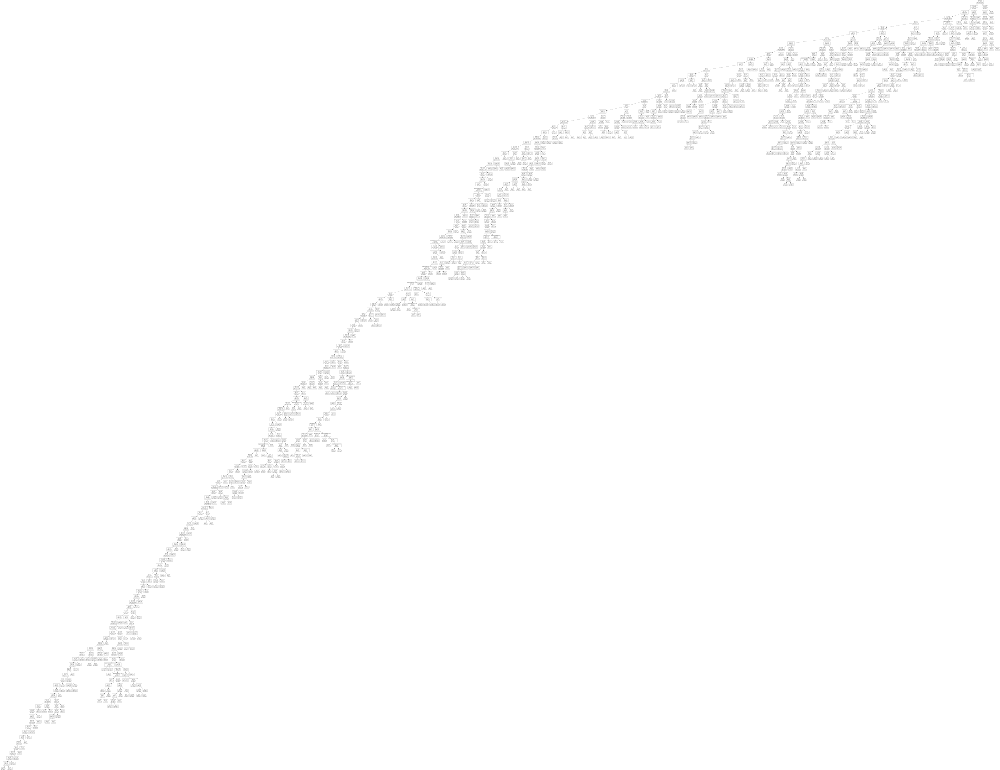

In [61]:
import graphviz
from sklearn import tree
dot_data6 = tree.export_graphviz(clf_gini.fit(X_train6, y_train6), out_file=None, max_depth=10000, feature_names=feature_names, class_names=class_names) 
graph6 = graphviz.Source(dot_data6)
graph6

In [62]:
graph = pydotplus.graph_from_dot_data(dot_data6)
graph.write_pdf("/Users/angieryu2202/Desktop/noun.pdf")

True

In [63]:
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100, max_depth=10000, min_samples_leaf=10, )
clf_gini6 = clf_gini.fit(X_train6, y_train6)

#Getting the accuracy score
acc6 = clf_gini6.score(X_test6, y_test6)
print("Accuracy score is {:.2f}%".format(acc6 * 100))

Accuracy score is 90.96%


In [64]:
#Setting the GNB classifier
gnb = GaussianNB()
gnb6 = gnb.fit(X_train6, y_train6)
#Predicting the testing data
predict_list6 = gnb6.predict(X_test6)
#print("Predictions of X_test6 are" + str(predict_list6))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list6:
    if predict_list6[i] == y_test6[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list6)*100)+"%")

Accuracy score is 0.0%


In [65]:
mnb = MultinomialNB()
mnb6 =mnb.fit(X_train6, y_train6)
predict_list6 = mnb6.predict(X_test6)
#print("Predictions of X_test6 are" + str(predict_list6))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list6:
    if predict_list6[i] == y_test6[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list6)*100)+"%")

Accuracy score is 0.0343878954607978%


## Terms

In [66]:
token_dict = {}
stemmer = PorterStemmer()

def stem_tokens(tokens, stemmer):
    stemmed = []
    for item in tokens:
        stemmed.append(stemmer.stem(item))
    return stemmed

def tokenize(text):
    tokens = nltk.word_tokenize(text)
    stems = stem_tokens(tokens, stemmer)
    return stems

tests = reviews
index = 0
for test in tests:
    lowers = test.lower()
    translator = str.maketrans("", "", string.punctuation)
    no_punctuation = lowers.translate(translator)
    
    tags_en = nltk.pos_tag(no_punctuation.split())
    
    token_dict[index] = no_punctuation
    index = index + 1

#token_dict

In [67]:
#this can take some time
tfidf = TfidfVectorizer(tokenizer=tokenize, stop_words='english')
tfs = tfidf.fit_transform(token_dict.values())
feature_names = tfidf.get_feature_names()
class_names = ['cluster 1', 'cluster 2', 'cluster 3']

In [68]:
dat = tfs.tocoo()
dat.row
dat.col
dat.data
mat = np.zeros(shape=tfs.shape)

index = 0
for index in range(len(dat.col)):
    #print(row, col)
    #print(index)
    mat[dat.row[index]][dat.col[index]] = dat.data[index]
    index = index + 1

In [69]:
X2 = mat
Y2 = targets
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, Y2, test_size = 0.2, random_state = 0)

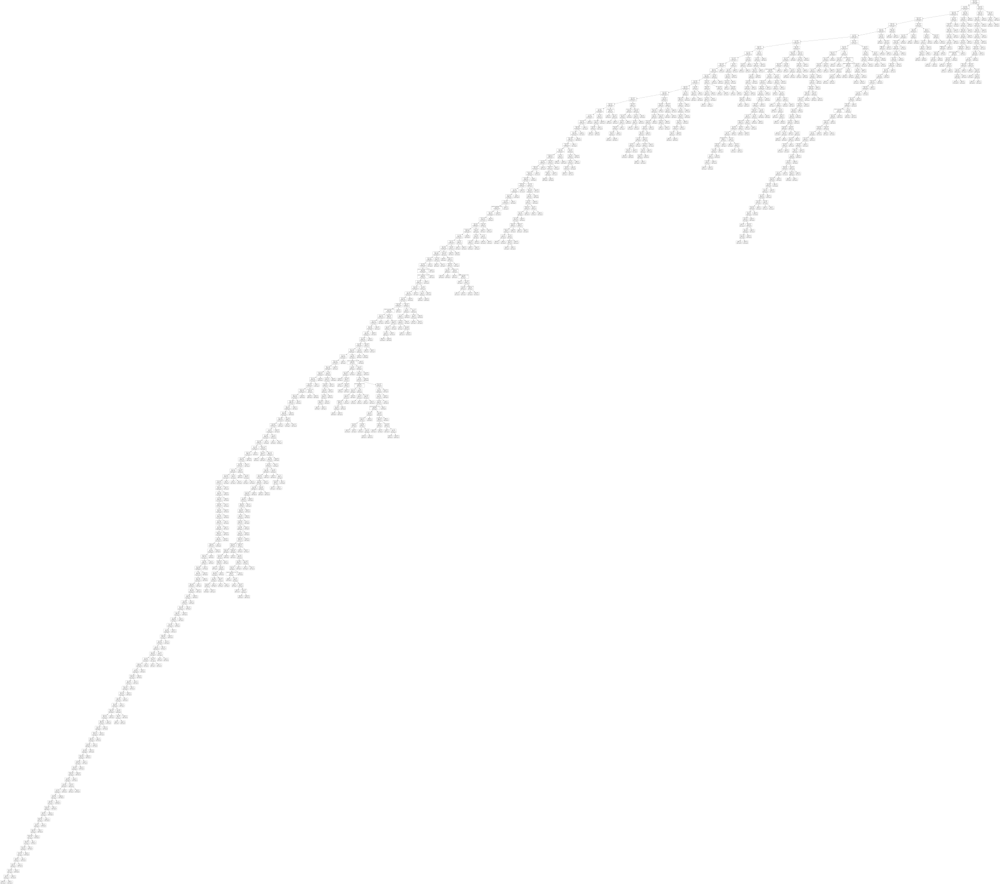

In [70]:
import graphviz
from sklearn import tree
dot_data2 = tree.export_graphviz(clf_gini.fit(X_train2, y_train2), out_file=None, max_depth=10000, feature_names=feature_names, class_names=class_names) 
graph2 = graphviz.Source(dot_data2)
graph2

In [71]:
graph = pydotplus.graph_from_dot_data(dot_data2)
graph.write_pdf("/Users/angieryu2202/Desktop/terms.pdf")

True

In [72]:
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100, max_depth=10000, min_samples_leaf=10, )
clf_gini2 = clf_gini.fit(X_train2, y_train2)

#Getting the accuracy score
acc2 = clf_gini2.score(X_test2, y_test2)
print("Accuracy score is {:.2f}%".format(acc2 * 100))

Accuracy score is 92.11%


In [73]:
#Setting the GNB classifier
gnb = GaussianNB()
gnb2 = gnb.fit(X_train2, y_train2)
#Predicting the testing data
predict_list2 = gnb2.predict(X_test2)
#print("Predictions of X_test2 are" + str(predict_list2))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list2:
    if predict_list2[i] == y_test2[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list2)*100)+"%")

Accuracy score is 0.0%


In [74]:
mnb = MultinomialNB()
mnb2 =mnb.fit(X_train2, y_train2)
predict_list2 = mnb2.predict(X_test2)
#print("Predictions of X_test2 are" + str(predict_list2))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list2:
    if predict_list2[i] == y_test2[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list2)*100)+"%")

Accuracy score is 41.213892709766164%


## Terms + Compounds 

In [20]:
import nltk
import string
import os

from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem.porter import PorterStemmer

token_dict = {}
stemmer = PorterStemmer()

def stem_tokens(tokens, stemmer):
    stemmed = []
    for item in tokens:
        stemmed.append(stemmer.stem(item))
    return stemmed

def tokenize(text):
    tokens = nltk.word_tokenize(text)
    stems = stem_tokens(tokens, stemmer)
    return stems

tests = reviews
index = 0
for test in tests:
    lowers = test.lower()
    translator = str.maketrans("", "", string.punctuation)
    no_punctuation = lowers.translate(translator)
    
    tags_en = nltk.pos_tag(no_punctuation.split())
    
    token_dict[index] = no_punctuation
    index = index + 1

In [21]:
#this can take some time
tfidf = TfidfVectorizer(tokenizer=tokenize, stop_words='english')
tfs = tfidf.fit_transform(token_dict.values())
feature_names = tfidf.get_feature_names()
feature_names.append('compound')
class_names = ['cluster 1', 'cluster 2', 'cluster 3']

In [22]:
import numpy as np
dat = tfs.tocoo()
dat.row
dat.col
dat.data
mat = np.zeros(shape=tfs.shape)

index = 0
for index in range(len(dat.col)):
    #print(row, col)
    #print(index)
    mat[dat.row[index]][dat.col[index]] = dat.data[index]
    index = index + 1

In [23]:
combined = np.hstack((mat, np.atleast_2d(compounds).T))

In [24]:
from sklearn.model_selection import train_test_split
X3 = combined
Y3 = targets
X_train3, X_test3, y_train3, y_test3 = train_test_split(X3, Y3, test_size = 0.2, random_state = 0)

In [25]:
from sklearn.tree import DecisionTreeClassifier
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100, max_depth=10000, min_samples_leaf=10, )

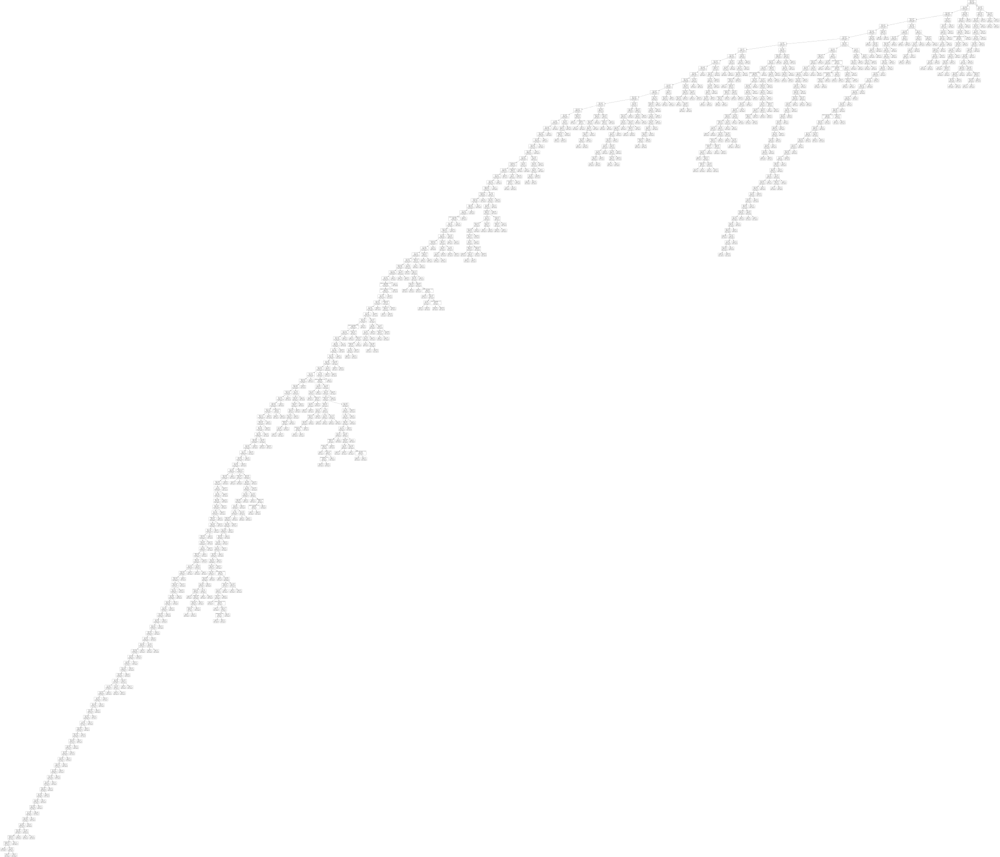

In [27]:
import graphviz
from sklearn import tree
dot_data3 = tree.export_graphviz(clf_gini.fit(X_train3, y_train3), out_file=None, max_depth=10000, feature_names=feature_names, class_names=class_names) 
graph3 = graphviz.Source(dot_data3)
graph3

In [28]:
import pydotplus
graph = pydotplus.graph_from_dot_data(dot_data3)
graph.write_pdf("/Users/angieryu2202/Desktop/terms_compounds_combined.pdf")

True

In [ ]:
clf_gini3 = clf_gini.fit(X_train3, y_train3)

#Getting the accuracy score
acc3 = clf_gini3.score(X_test3, y_test3)
print("Accuracy score is {:.2f}%".format(acc3 * 100))

In [ ]:
#Setting the GNB classifier
gnb = GaussianNB()
gnb3 = gnb.fit(X_train3, y_train3)
#Predicting the testing data
predict_list3 = gnb3.predict(X_test3)
#print("Predictions of X_test3 are" + str(predict_list3))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list3:
    if predict_list3[i] == y_test3[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list3)*100)+"%")

In [ ]:
mnb = MultinomialNB()
mnb3 =mnb.fit(X_train3, y_train3)
predict_list3 = mnb3.predict(X_test3)
#print("Predictions of X_test3 are" + str(predict_list3))
#Getting the numerator for measuring the accuracy score
x = 0
for i in predict_list3:
    if predict_list3[i] == y_test3[i]:
        x+=1
    else:
        x+=0
#Getting the accuracy score
print("Accuracy score is " + str(x/len(predict_list3)*100)+"%")